# Tomato Model Comparisons

### Import Dependencies

In [70]:
import tensorflow as tf
from PIL import Image
import cv2, pathlib, splitfolders
from tensorflow.keras.layers import *
from keras.preprocessing.image import ImageDataGenerator
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from keras.preprocessing import image
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint
from sklearn.metrics import confusion_matrix, classification_report
import os
import shutil
import pickle
import tempfile
from sklearn.model_selection import train_test_split

In [71]:
import seaborn as sns

In [72]:
np.__version__

'1.23.5'

In [73]:
tf.__version__

'2.6.0'

In [74]:
physical_devices = tf.config.experimental.list_physical_devices('GPU')
print("Num GPUs Available: ", len(physical_devices))

Num GPUs Available:  1


### Reload Data

In [75]:
IMAGE_SIZE = 224
TARGET_SIZE = (IMAGE_SIZE, IMAGE_SIZE)
INPUT_SHAPE = (IMAGE_SIZE, IMAGE_SIZE, 3)
CHANNELS = 3
BATCH_SIZE = 32
INPUT_SHAPE2 = (BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, CHANNELS)

In [76]:
#def get_dataset_partitions_pd(df, train_split=0.8, val_split=0.1, test_split=0.1):
#    assert (train_split + test_split + val_split) == 1
#    
    # Only allows for equal validation and test splits
#    assert val_split == test_split 

In [77]:
# Set up the base directory
base_dir = "./AgroAI/Tomato"

In [78]:
dataset = tf.keras.preprocessing.image_dataset_from_directory(
            base_dir,
            labels = 'inferred',
            shuffle = True,
            image_size = (IMAGE_SIZE, IMAGE_SIZE),
            batch_size = BATCH_SIZE,
            color_mode = 'rgb'
)

Found 9119 files belonging to 10 classes.


In [79]:
type(dataset)

tensorflow.python.data.ops.dataset_ops.BatchDataset

In [80]:
#def resize_data(images, labels):
#    tf.print('Original shape -->', tf.shape(images))
#    SIZE = (224, 224)
#    return tf.image.resize(images, SIZE), labels

In [81]:
#dataset = dataset.map(resize_data)

In [82]:
classes = dataset.class_names
classes

['Tomato Bacterial spot',
 'Tomato Early blight',
 'Tomato Late blight',
 'Tomato Leaf Mold',
 'Tomato Septoria leaf spot',
 'Tomato Spider mites Two spotted spider mite',
 'Tomato Target Spot',
 'Tomato Tomato Yellow Leaf Curl Virus',
 'Tomato Tomato mosaic virus',
 'Tomato healthy']

In [83]:
len(dataset)

285

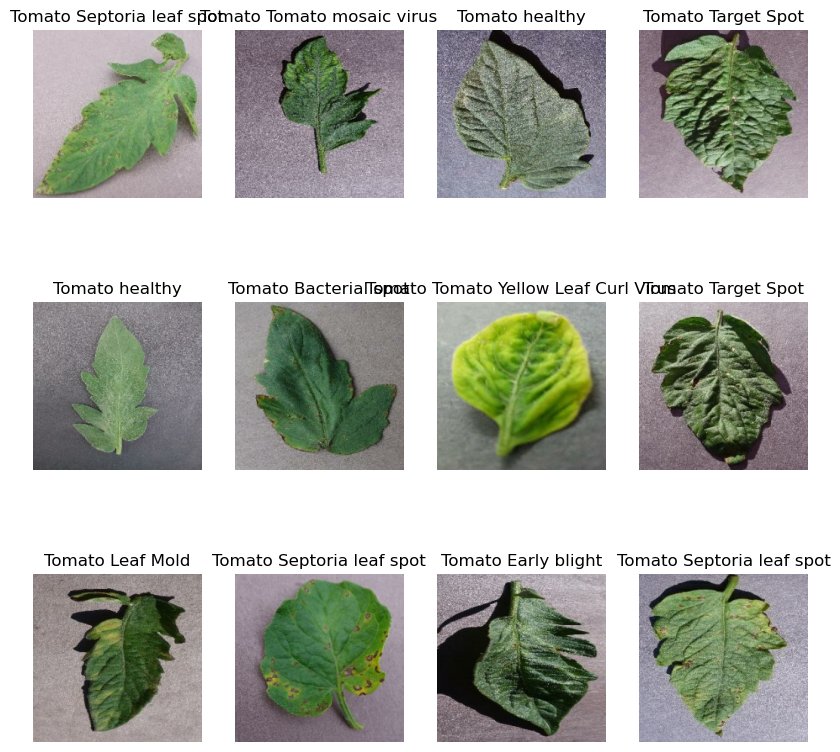

In [84]:
plt.figure(figsize=(10,10))
for image_batch , label_batch in dataset.take(1):
    for i in range(12):
        ax = plt.subplot(3,4,i+1)
        plt.imshow(image_batch[i].numpy().astype('uint8'))
        plt.title(classes[label_batch[i]])
        plt.axis('off')

In [85]:
len(dataset) * 64

18240

### Data Splitting

In [86]:
def data_split(data, train_split = 0.8, val_split = 0.15, 
               test_split = 0.05, shuffle=True, shuffle_size = 10000):
    data_size = len(data)
    if shuffle:
        data = data.shuffle(shuffle_size, seed=8)
    
    train_size = int(train_split * data_size)
    val_size = int(val_split * data_size)
    
    train_ds = data.take(train_size)
    val_ds = data.skip(train_size).take(val_size)
    test_ds = data.skip(train_size).skip(val_size)
    
    return train_ds, val_ds, test_ds

In [87]:
train_ds, val_ds, test_ds = data_split(dataset)

In [88]:
print("Length of Training Dataset is",len(train_ds))
print("\nLength of Validation Dataset is",len(val_ds))
print("\nLength of Testing Dataset is",len(test_ds))

Length of Training Dataset is 228

Length of Validation Dataset is 42

Length of Testing Dataset is 15


### Model 1: Convolutional Neural Network v3

In [90]:
cnn_model = tf.keras.models.load_model('CNNModel_Tomato_v1.h5')
cnn_model.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential (Sequential)      (None, 224, 224, 3)       0         
_________________________________________________________________
sequential_1 (Sequential)    (None, None, 224, 3)      0         
_________________________________________________________________
conv2d_12 (Conv2D)           (None, None, 222, 32)     896       
_________________________________________________________________
max_pooling2d_11 (MaxPooling (None, None, 111, 32)     0         
_________________________________________________________________
conv2d_13 (Conv2D)           (None, None, 109, 32)     9248      
_________________________________________________________________
max_pooling2d_12 (MaxPooling (None, None, 54, 32)      0         
_________________________________________________________________
conv2d_14 (Conv2D)           (None, None, 52, 64)     

In [91]:
score_train = cnn_model.evaluate(train_ds)
score_valid = cnn_model.evaluate(val_ds)
score_test = cnn_model.evaluate(test_ds)

15/15 [==============================] - 2s 15ms/step - loss: 0.0637 - accuracy: 0.9750


first image to predict
actual label: Tomato Leaf Mold
predicted label: Tomato Leaf Mold


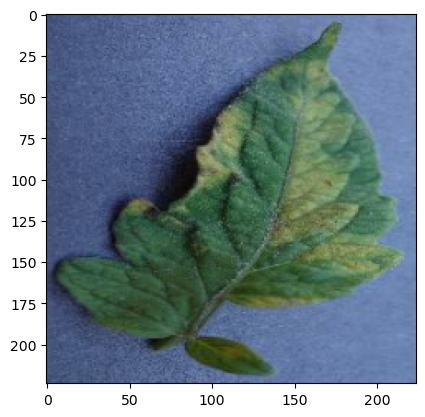

In [92]:
import numpy as np
for images_batch, labels_batch in test_ds.take(1):
    
    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()
    
    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",classes[first_label])
    
    batch_prediction = cnn_model.predict(images_batch)
    print("predicted label:",classes[np.argmax(batch_prediction[0])])

In [93]:
def predict(model,img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0) # Create a batch
    predictions = model.predict (img_array)
    predicted_class = classes[np.argmax(predictions[0])]
#     confidence = round(np.max(predictions[0]),2)
    confidence = round(100*(np.max(predictions[0])),2)

    return predicted_class, confidence

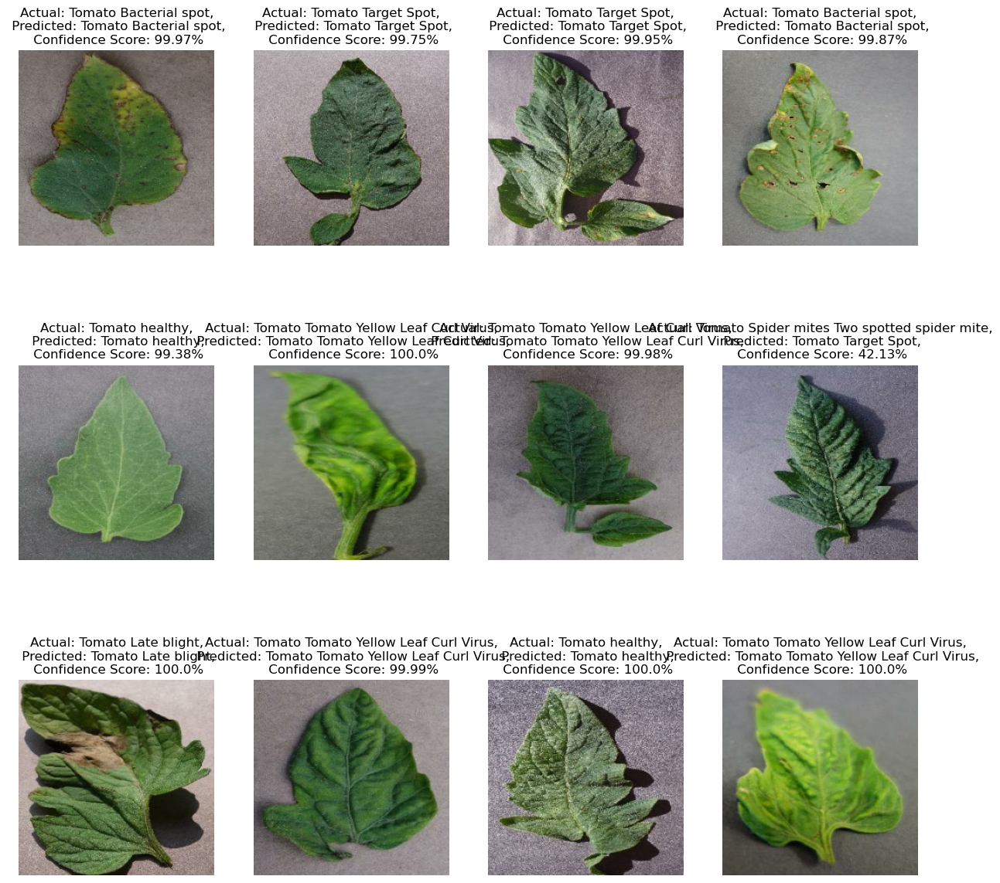

In [94]:
plt.figure(figsize=(15,15))
for images,labels in test_ds.take(1):
    for i in range(12):
        ax = plt.subplot(3,4,i+1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class , confidence = predict(cnn_model,images[i].numpy())
        actual_class = classes[labels[i]]
        
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class},\n Confidence Score: {confidence}%")
        plt.axis("off")

In [95]:
pred_class = []
act_class = []
for images,labels in test_ds:
    for i in range(len(test_ds)):
        #ax = plt.subplot(3,4,i+1)
        #plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class , confidence = predict(cnn_model,images[i].numpy())
        actual_class = classes[labels[i]]

        pred_class.append(predicted_class)
        act_class.append(actual_class)

In [96]:
act_class

['Tomato Late blight',
 'Tomato Target Spot',
 'Tomato Early blight',
 'Tomato healthy',
 'Tomato Tomato mosaic virus',
 'Tomato Late blight',
 'Tomato Target Spot',
 'Tomato Septoria leaf spot',
 'Tomato Late blight',
 'Tomato Bacterial spot',
 'Tomato Bacterial spot',
 'Tomato Tomato Yellow Leaf Curl Virus',
 'Tomato Late blight',
 'Tomato Spider mites Two spotted spider mite',
 'Tomato Tomato Yellow Leaf Curl Virus',
 'Tomato Target Spot',
 'Tomato Target Spot',
 'Tomato Early blight',
 'Tomato Spider mites Two spotted spider mite',
 'Tomato Target Spot',
 'Tomato Tomato Yellow Leaf Curl Virus',
 'Tomato Early blight',
 'Tomato Tomato mosaic virus',
 'Tomato Leaf Mold',
 'Tomato Septoria leaf spot',
 'Tomato Tomato Yellow Leaf Curl Virus',
 'Tomato Spider mites Two spotted spider mite',
 'Tomato Late blight',
 'Tomato Late blight',
 'Tomato Leaf Mold',
 'Tomato Septoria leaf spot',
 'Tomato Tomato Yellow Leaf Curl Virus',
 'Tomato Septoria leaf spot',
 'Tomato Spider mites Two spott

In [97]:
cm = confusion_matrix(act_class, pred_class, labels=classes)

In [98]:
def plot_confusion_matrix(cm, classes):
    plt.figure(figsize=(16,5))
    ax = sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')
    ax.set_title('Confusion Matrix with labels\n');
    ax.set_xlabel('\nPredicted Values')
    ax.set_ylabel('Actual Values ');

    ax.xaxis.set_ticklabels(classes, rotation=45)
    ax.yaxis.set_ticklabels(classes, rotation=45)

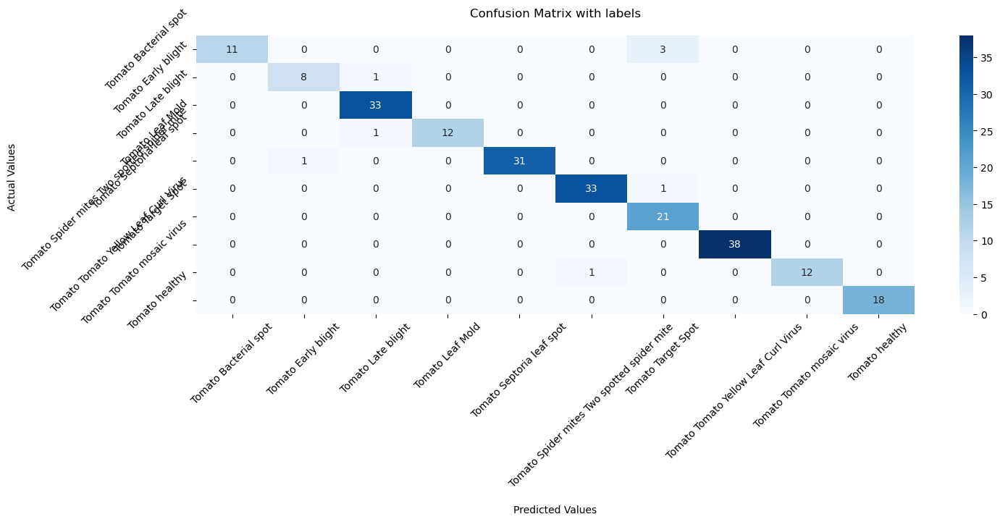

In [99]:
plot_confusion_matrix(cm = cm, classes = classes)

### Model 2: MobileNetV2

In [100]:
mbnet_model = tf.keras.models.load_model('MBNetv2Model_Tomato_v1.h5')
mbnet_model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 112, 112, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 112, 112, 32) 128         Conv1[0][0]                      
__________________________________________________________________________________________________
Conv1_relu (ReLU)               (None, 112, 112, 32) 0           bn_Conv1[0][0]                   
______________________________________________________________________________________________

In [101]:
score_train = mbnet_model.evaluate(train_ds)
score_valid = mbnet_model.evaluate(val_ds)
score_test = mbnet_model.evaluate(test_ds)

15/15 [==============================] - 3s 35ms/step - loss: 0.0146 - accuracy: 0.9979


first image to predict
actual label: Tomato Late blight
predicted label: Tomato Late blight


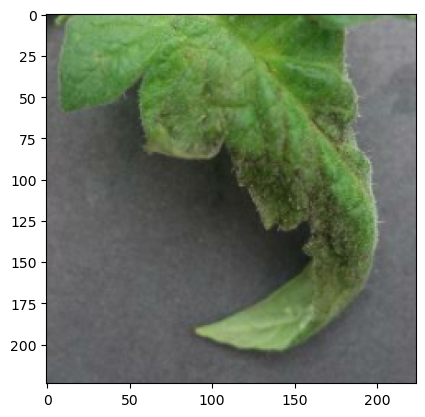

In [102]:
import numpy as np
for images_batch, labels_batch in test_ds.take(1):
    
    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()
    
    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",classes[first_label])
    
    batch_prediction = mbnet_model.predict(images_batch)
    print("predicted label:",classes[np.argmax(batch_prediction[0])])

In [103]:
def predict(model,img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0) # Create a batch
    predictions = model.predict (img_array)
    predicted_class = classes[np.argmax(predictions[0])]
#     confidence = round(np.max(predictions[0]),2)
    confidence = round(100*(np.max(predictions[0])),2)

    return predicted_class, confidence

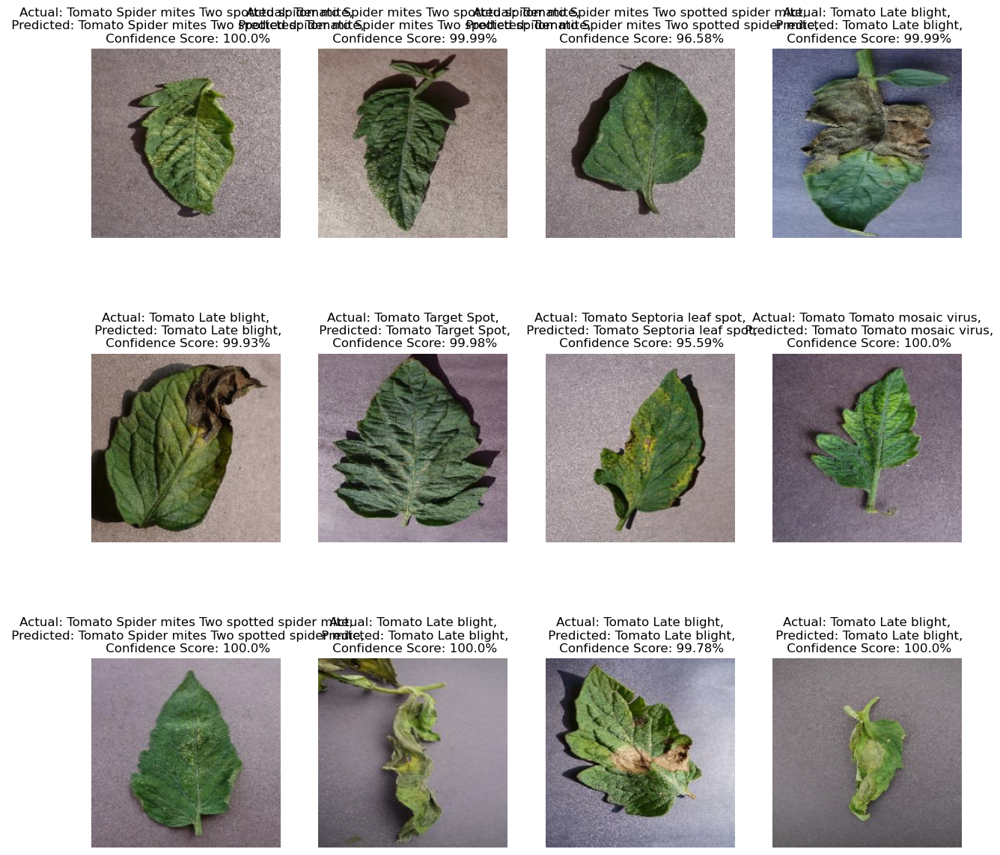

In [104]:
plt.figure(figsize=(15,15))
for images,labels in test_ds.take(1):
    for i in range(12):
        ax = plt.subplot(3,4,i+1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class , confidence = predict(mbnet_model,images[i].numpy())
        actual_class = classes[labels[i]]
        
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class},\n Confidence Score: {confidence}%")
        plt.axis("off")

In [105]:
pred_class = []
act_class = []
for images,labels in test_ds:
    for i in range(len(test_ds)):
        #ax = plt.subplot(3,4,i+1)
        #plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class , confidence = predict(mbnet_model,images[i].numpy())
        actual_class = classes[labels[i]]

        pred_class.append(predicted_class)
        act_class.append(actual_class)

In [106]:
act_class

['Tomato Late blight',
 'Tomato Septoria leaf spot',
 'Tomato Target Spot',
 'Tomato healthy',
 'Tomato Spider mites Two spotted spider mite',
 'Tomato healthy',
 'Tomato Septoria leaf spot',
 'Tomato Septoria leaf spot',
 'Tomato Leaf Mold',
 'Tomato Septoria leaf spot',
 'Tomato Leaf Mold',
 'Tomato healthy',
 'Tomato Early blight',
 'Tomato Leaf Mold',
 'Tomato Tomato Yellow Leaf Curl Virus',
 'Tomato healthy',
 'Tomato Spider mites Two spotted spider mite',
 'Tomato healthy',
 'Tomato Septoria leaf spot',
 'Tomato Late blight',
 'Tomato Late blight',
 'Tomato Early blight',
 'Tomato healthy',
 'Tomato Septoria leaf spot',
 'Tomato Late blight',
 'Tomato Target Spot',
 'Tomato Tomato Yellow Leaf Curl Virus',
 'Tomato Tomato Yellow Leaf Curl Virus',
 'Tomato Tomato Yellow Leaf Curl Virus',
 'Tomato Tomato Yellow Leaf Curl Virus',
 'Tomato Tomato Yellow Leaf Curl Virus',
 'Tomato Septoria leaf spot',
 'Tomato Septoria leaf spot',
 'Tomato Late blight',
 'Tomato Tomato mosaic virus',
 

In [107]:
cm = confusion_matrix(act_class, pred_class, labels=classes)

In [108]:
def plot_confusion_matrix(cm, classes):
    plt.figure(figsize=(16,5))
    ax = sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')
    ax.set_title('Confusion Matrix with labels\n');
    ax.set_xlabel('\nPredicted Values')
    ax.set_ylabel('Actual Values ');

    ax.xaxis.set_ticklabels(classes, rotation=45)
    ax.yaxis.set_ticklabels(classes, rotation=45)

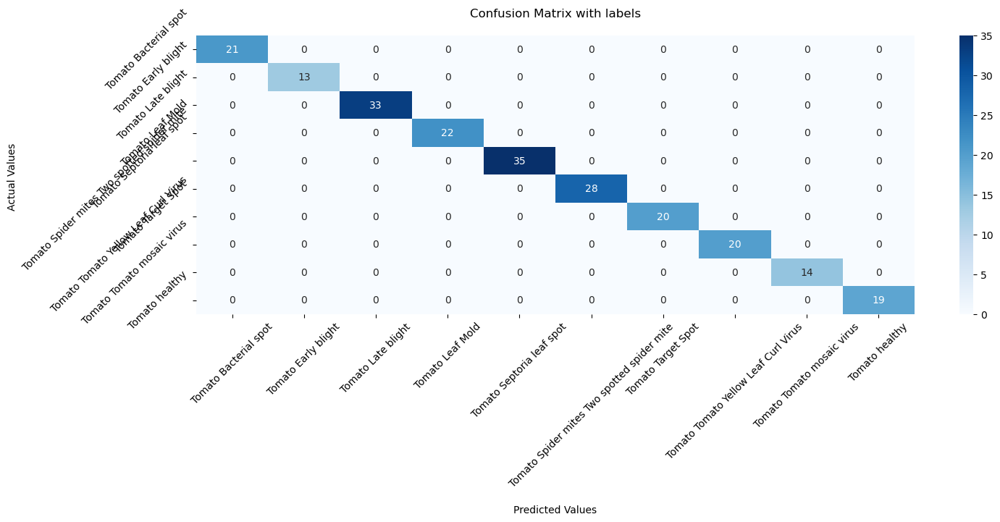

In [109]:
plot_confusion_matrix(cm = cm, classes = classes)

### Model 3: InceptionV3

In [110]:
inc_model = tf.keras.models.load_model('Inceptionv3Model_Tomato_v1.h5')
inc_model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 111, 111, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 111, 111, 32) 96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 111, 111, 32) 0           batch_normalization[0][0]        
______________________________________________________________________________________________

In [111]:
score_train = inc_model.evaluate(train_ds)
score_valid = inc_model.evaluate(val_ds)
score_test = inc_model.evaluate(test_ds)

15/15 [==============================] - 3s 50ms/step - loss: 0.0658 - accuracy: 0.9729


first image to predict
actual label: Tomato Tomato Yellow Leaf Curl Virus
predicted label: Tomato Tomato Yellow Leaf Curl Virus


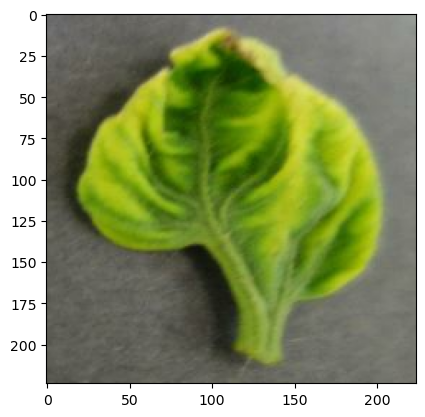

In [112]:
import numpy as np
for images_batch, labels_batch in test_ds.take(1):
    
    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()
    
    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",classes[first_label])
    
    batch_prediction = inc_model.predict(images_batch)
    print("predicted label:",classes[np.argmax(batch_prediction[0])])

In [113]:
def predict(model,img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0) # Create a batch
    predictions = model.predict (img_array)
    predicted_class = classes[np.argmax(predictions[0])]
#     confidence = round(np.max(predictions[0]),2)
    confidence = round(100*(np.max(predictions[0])),2)

    return predicted_class, confidence

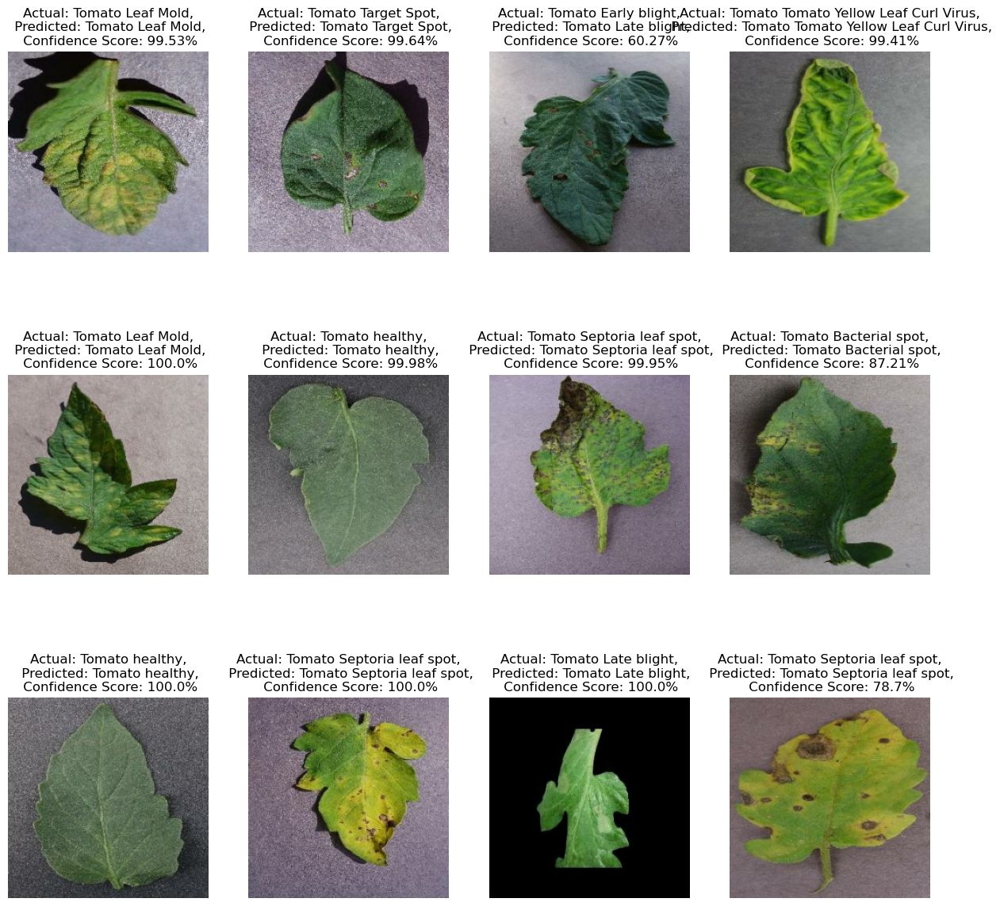

In [114]:
plt.figure(figsize=(15,15))
for images,labels in test_ds.take(1):
    for i in range(12):
        ax = plt.subplot(3,4,i+1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class , confidence = predict(inc_model,images[i].numpy())
        actual_class = classes[labels[i]]
        
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class},\n Confidence Score: {confidence}%")
        plt.axis("off")

In [115]:
pred_class = []
act_class = []
for images,labels in test_ds:
    for i in range(len(test_ds)):
        #ax = plt.subplot(3,4,i+1)
        #plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class , confidence = predict(inc_model,images[i].numpy())
        actual_class = classes[labels[i]]

        pred_class.append(predicted_class)
        act_class.append(actual_class)

In [116]:
act_class

['Tomato Target Spot',
 'Tomato Target Spot',
 'Tomato Spider mites Two spotted spider mite',
 'Tomato healthy',
 'Tomato Spider mites Two spotted spider mite',
 'Tomato healthy',
 'Tomato Leaf Mold',
 'Tomato healthy',
 'Tomato Early blight',
 'Tomato Spider mites Two spotted spider mite',
 'Tomato Target Spot',
 'Tomato Late blight',
 'Tomato Septoria leaf spot',
 'Tomato Spider mites Two spotted spider mite',
 'Tomato Leaf Mold',
 'Tomato Tomato Yellow Leaf Curl Virus',
 'Tomato healthy',
 'Tomato Tomato Yellow Leaf Curl Virus',
 'Tomato Spider mites Two spotted spider mite',
 'Tomato Early blight',
 'Tomato Tomato Yellow Leaf Curl Virus',
 'Tomato healthy',
 'Tomato Leaf Mold',
 'Tomato Tomato Yellow Leaf Curl Virus',
 'Tomato Target Spot',
 'Tomato Late blight',
 'Tomato Tomato Yellow Leaf Curl Virus',
 'Tomato Tomato mosaic virus',
 'Tomato Septoria leaf spot',
 'Tomato Tomato mosaic virus',
 'Tomato Target Spot',
 'Tomato Septoria leaf spot',
 'Tomato Target Spot',
 'Tomato Targ

In [117]:
cm = confusion_matrix(act_class, pred_class, labels=classes)

In [118]:
def plot_confusion_matrix(cm, classes):
    plt.figure(figsize=(16,5))
    ax = sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')
    ax.set_title('Confusion Matrix with labels\n');
    ax.set_xlabel('\nPredicted Values')
    ax.set_ylabel('Actual Values ');

    ax.xaxis.set_ticklabels(classes, rotation=45)
    ax.yaxis.set_ticklabels(classes, rotation=45)

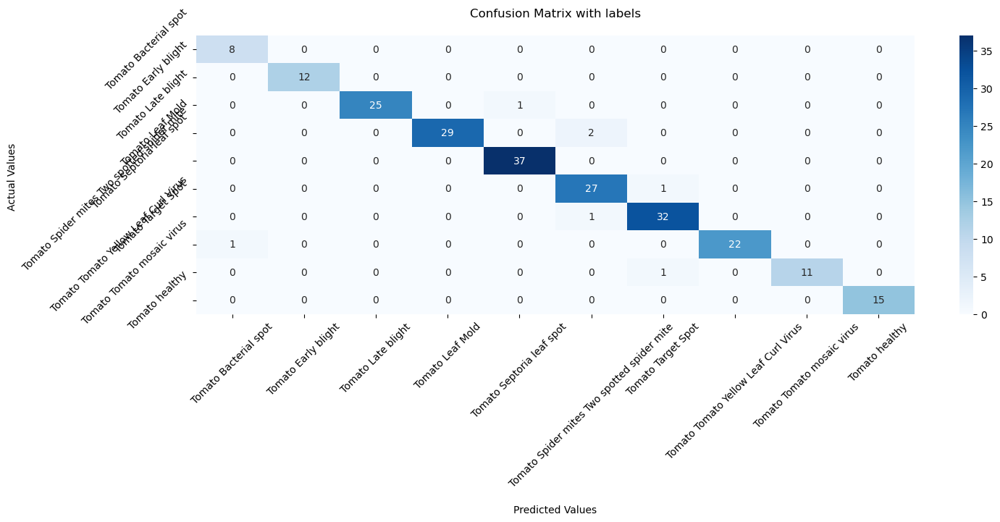

In [119]:
plot_confusion_matrix(cm = cm, classes = classes)

### Model 4: DenseNet121

In [120]:
dense_model = tf.keras.models.load_model('DenseNet121Model_Tomato_v1.h5')
dense_model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
tf.math.truediv (TFOpLambda) (None, 224, 224, 3)       0         
_________________________________________________________________
tf.nn.bias_add (TFOpLambda)  (None, 224, 224, 3)       0         
_________________________________________________________________
tf.math.truediv_1 (TFOpLambd (None, 224, 224, 3)       0         
_________________________________________________________________
sequential_2 (Sequential)    (None, None, 224, 3)      0         
_________________________________________________________________
densenet121 (Functional)     (None, 7, 7, 1024)        7037504   
_________________________________________________________________
global_average_pooling2d (Gl (None, 1024)              0     

In [121]:
score_train = dense_model.evaluate(train_ds)
score_valid = dense_model.evaluate(val_ds)
score_test = dense_model.evaluate(test_ds)

15/15 [==============================] - 3s 66ms/step - loss: 0.2465 - accuracy: 0.8977


first image to predict
actual label: Tomato Tomato Yellow Leaf Curl Virus
predicted label: Tomato Tomato Yellow Leaf Curl Virus


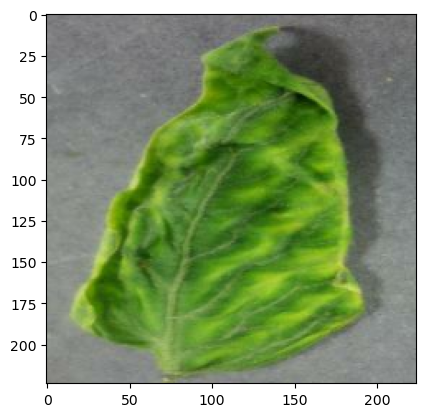

In [122]:
import numpy as np
for images_batch, labels_batch in test_ds.take(1):
    
    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()
    
    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",classes[first_label])
    
    batch_prediction = dense_model.predict(images_batch)
    print("predicted label:",classes[np.argmax(batch_prediction[0])])

In [123]:
def predict(model,img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0) # Create a batch
    predictions = model.predict (img_array)
    predicted_class = classes[np.argmax(predictions[0])]
#     confidence = round(np.max(predictions[0]),2)
    confidence = round(100*(np.max(predictions[0])),2)

    return predicted_class, confidence

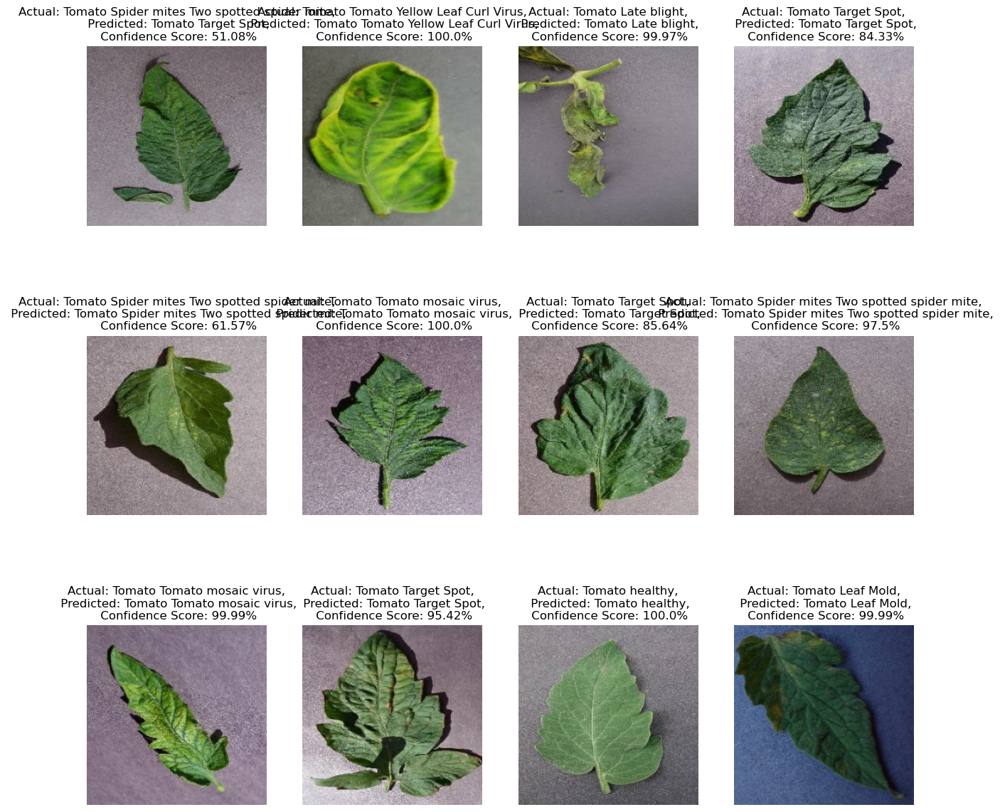

In [124]:
plt.figure(figsize=(15,15))
for images,labels in test_ds.take(1):
    for i in range(12):
        ax = plt.subplot(3,4,i+1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class , confidence = predict(dense_model,images[i].numpy())
        actual_class = classes[labels[i]]
        
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class},\n Confidence Score: {confidence}%")
        plt.axis("off")

In [125]:
pred_class = []
act_class = []
for images,labels in test_ds:
    for i in range(len(test_ds)):
        #ax = plt.subplot(3,4,i+1)
        #plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class , confidence = predict(dense_model,images[i].numpy())
        actual_class = classes[labels[i]]

        pred_class.append(predicted_class)
        act_class.append(actual_class)

In [126]:
act_class

['Tomato Early blight',
 'Tomato Spider mites Two spotted spider mite',
 'Tomato Target Spot',
 'Tomato Target Spot',
 'Tomato healthy',
 'Tomato Tomato Yellow Leaf Curl Virus',
 'Tomato Late blight',
 'Tomato Tomato Yellow Leaf Curl Virus',
 'Tomato Leaf Mold',
 'Tomato Early blight',
 'Tomato Late blight',
 'Tomato Septoria leaf spot',
 'Tomato Late blight',
 'Tomato Tomato mosaic virus',
 'Tomato Early blight',
 'Tomato Spider mites Two spotted spider mite',
 'Tomato Spider mites Two spotted spider mite',
 'Tomato Septoria leaf spot',
 'Tomato Tomato Yellow Leaf Curl Virus',
 'Tomato Target Spot',
 'Tomato Tomato Yellow Leaf Curl Virus',
 'Tomato healthy',
 'Tomato Bacterial spot',
 'Tomato Tomato mosaic virus',
 'Tomato Late blight',
 'Tomato Target Spot',
 'Tomato Spider mites Two spotted spider mite',
 'Tomato Spider mites Two spotted spider mite',
 'Tomato Spider mites Two spotted spider mite',
 'Tomato Late blight',
 'Tomato Tomato Yellow Leaf Curl Virus',
 'Tomato Septoria lea

In [127]:
cm = confusion_matrix(act_class, pred_class, labels=classes)

In [128]:
def plot_confusion_matrix(cm, classes):
    plt.figure(figsize=(16,5))
    ax = sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')
    ax.set_title('Confusion Matrix with labels\n');
    ax.set_xlabel('\nPredicted Values')
    ax.set_ylabel('Actual Values ');

    ax.xaxis.set_ticklabels(classes, rotation=45)
    ax.yaxis.set_ticklabels(classes, rotation=45)

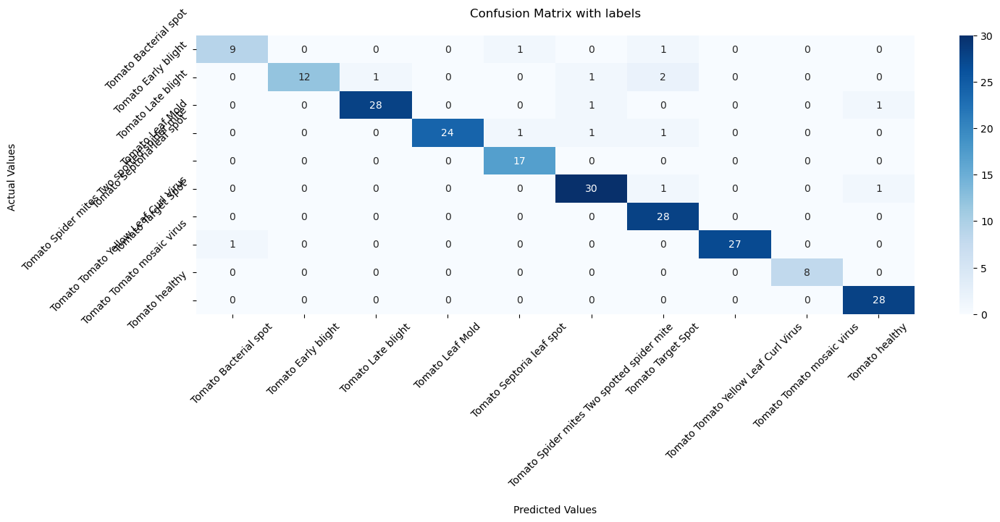

In [129]:
plot_confusion_matrix(cm = cm, classes = classes)

### Model 5: ResNet50

In [130]:
resnet_model = tf.keras.models.load_model('Resnet50Model_Tomato_v1.h5')
resnet_model.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
tf.__operators__.getitem_2 ( (None, 224, 224, 3)       0         
_________________________________________________________________
tf.nn.bias_add_2 (TFOpLambda (None, 224, 224, 3)       0         
_________________________________________________________________
resnet50 (Functional)        (None, 7, 7, 2048)        23587712  
_________________________________________________________________
global_average_pooling2d_2 ( (None, 2048)              0         
_________________________________________________________________
flatten_2 (Flatten)          (None, 2048)              0         
_________________________________________________________________
dense_8 (Dense)              (None, 512)               1049

In [131]:
score_train = resnet_model.evaluate(train_ds)
score_valid = resnet_model.evaluate(val_ds)
score_test = resnet_model.evaluate(test_ds)

15/15 [==============================] - 3s 68ms/step - loss: 0.0347 - accuracy: 0.9896


first image to predict
actual label: Tomato Leaf Mold
predicted label: Tomato Leaf Mold


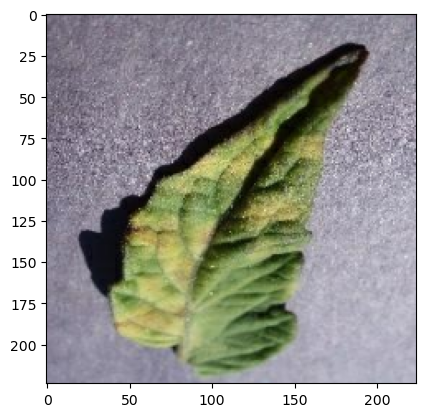

In [132]:
import numpy as np
for images_batch, labels_batch in test_ds.take(1):
    
    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()
    
    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",classes[first_label])
    
    batch_prediction = resnet_model.predict(images_batch)
    print("predicted label:",classes[np.argmax(batch_prediction[0])])

In [133]:
def predict(model,img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0) # Create a batch
    predictions = model.predict (img_array)
    predicted_class = classes[np.argmax(predictions[0])]
#     confidence = round(np.max(predictions[0]),2)
    confidence = round(100*(np.max(predictions[0])),2)

    return predicted_class, confidence

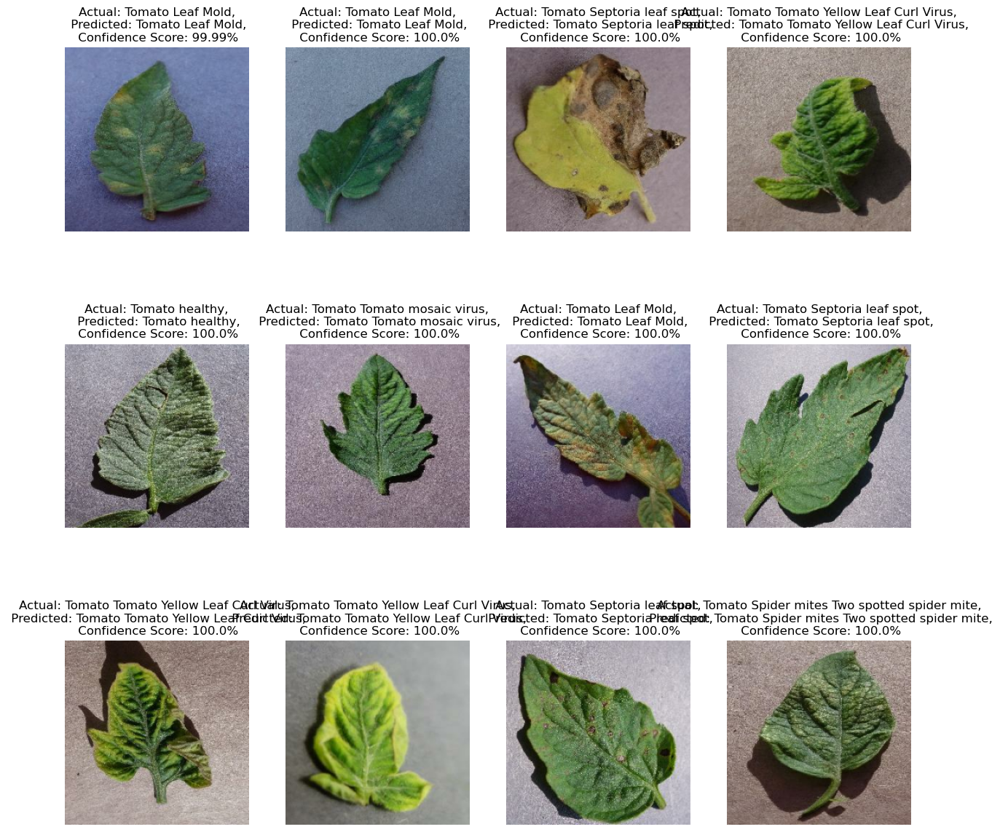

In [134]:
plt.figure(figsize=(15,15))
for images,labels in test_ds.take(1):
    for i in range(12):
        ax = plt.subplot(3,4,i+1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class , confidence = predict(resnet_model,images[i].numpy())
        actual_class = classes[labels[i]]
        
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class},\n Confidence Score: {confidence}%")
        plt.axis("off")

In [135]:
pred_class = []
act_class = []
for images,labels in test_ds:
    for i in range(len(test_ds)):
        #ax = plt.subplot(3,4,i+1)
        #plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class , confidence = predict(resnet_model,images[i].numpy())
        actual_class = classes[labels[i]]

        pred_class.append(predicted_class)
        act_class.append(actual_class)

In [136]:
act_class

['Tomato Spider mites Two spotted spider mite',
 'Tomato Leaf Mold',
 'Tomato Septoria leaf spot',
 'Tomato Spider mites Two spotted spider mite',
 'Tomato Leaf Mold',
 'Tomato Leaf Mold',
 'Tomato Spider mites Two spotted spider mite',
 'Tomato healthy',
 'Tomato Spider mites Two spotted spider mite',
 'Tomato healthy',
 'Tomato Leaf Mold',
 'Tomato Tomato Yellow Leaf Curl Virus',
 'Tomato Septoria leaf spot',
 'Tomato Target Spot',
 'Tomato Spider mites Two spotted spider mite',
 'Tomato Septoria leaf spot',
 'Tomato Late blight',
 'Tomato Tomato Yellow Leaf Curl Virus',
 'Tomato Leaf Mold',
 'Tomato Late blight',
 'Tomato Leaf Mold',
 'Tomato Early blight',
 'Tomato Leaf Mold',
 'Tomato Tomato Yellow Leaf Curl Virus',
 'Tomato Target Spot',
 'Tomato Leaf Mold',
 'Tomato Target Spot',
 'Tomato Leaf Mold',
 'Tomato Septoria leaf spot',
 'Tomato Leaf Mold',
 'Tomato Early blight',
 'Tomato Leaf Mold',
 'Tomato Leaf Mold',
 'Tomato Spider mites Two spotted spider mite',
 'Tomato Bacteri

In [148]:
cm = confusion_matrix(act_class, pred_class, labels=classes)

In [149]:
def plot_confusion_matrix(cm, classes):
    plt.figure(figsize=(16,5))
    ax = sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')
    ax.set_title('Confusion Matrix with labels\n');
    ax.set_xlabel('\nPredicted Values')
    ax.set_ylabel('Actual Values ');

    ax.xaxis.set_ticklabels(classes, rotation=45)
    ax.yaxis.set_ticklabels(classes, rotation=45)

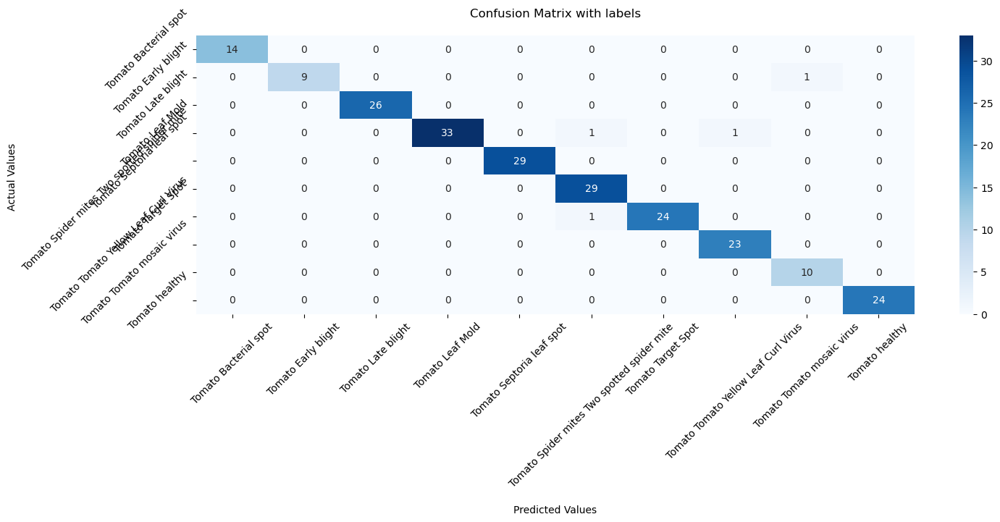

In [150]:
plot_confusion_matrix(cm = cm, classes = classes)

### Compiled Comparison

In [140]:
list_modelnames = ["CNNModel_Tomato_Save1", "Resnet50Model_Tomato_Save1", 
                   "DenseNet121Model_Tomato_Save1", "Inceptionv3Model_Tomato_Save1", "MBNetv2Model_Tomato_Save1"]
dict_histories = {}
saved_model_his = "saved_model_history"

# load model into new variable
for modelname in list_modelnames:
  with open(os.path.join(saved_model_his, modelname), 'rb') as file_pi:
    dict_histories[modelname] = pickle.load(file_pi)

dict_histories.keys()

dict_keys(['CNNModel_Tomato_Save1', 'Resnet50Model_Tomato_Save1', 'DenseNet121Model_Tomato_Save1', 'Inceptionv3Model_Tomato_Save1', 'MBNetv2Model_Tomato_Save1'])

In [141]:
dict_acc = {}
dict_val_acc = {}
dict_loss = {}
dict_val_loss = {}

for modelname in list_modelnames:
  dict_acc[modelname] = dict_histories[modelname]['accuracy']
  dict_val_acc[modelname] = dict_histories[modelname]['val_accuracy']
  dict_loss[modelname] = dict_histories[modelname]['loss']
  dict_val_loss[modelname] = dict_histories[modelname]['val_loss']

label_plot = ['CNNModel','ResNet50','DenseNet121','InceptionV3','MobileNetV2']
marker_plot = ['o','x','v','^','d']

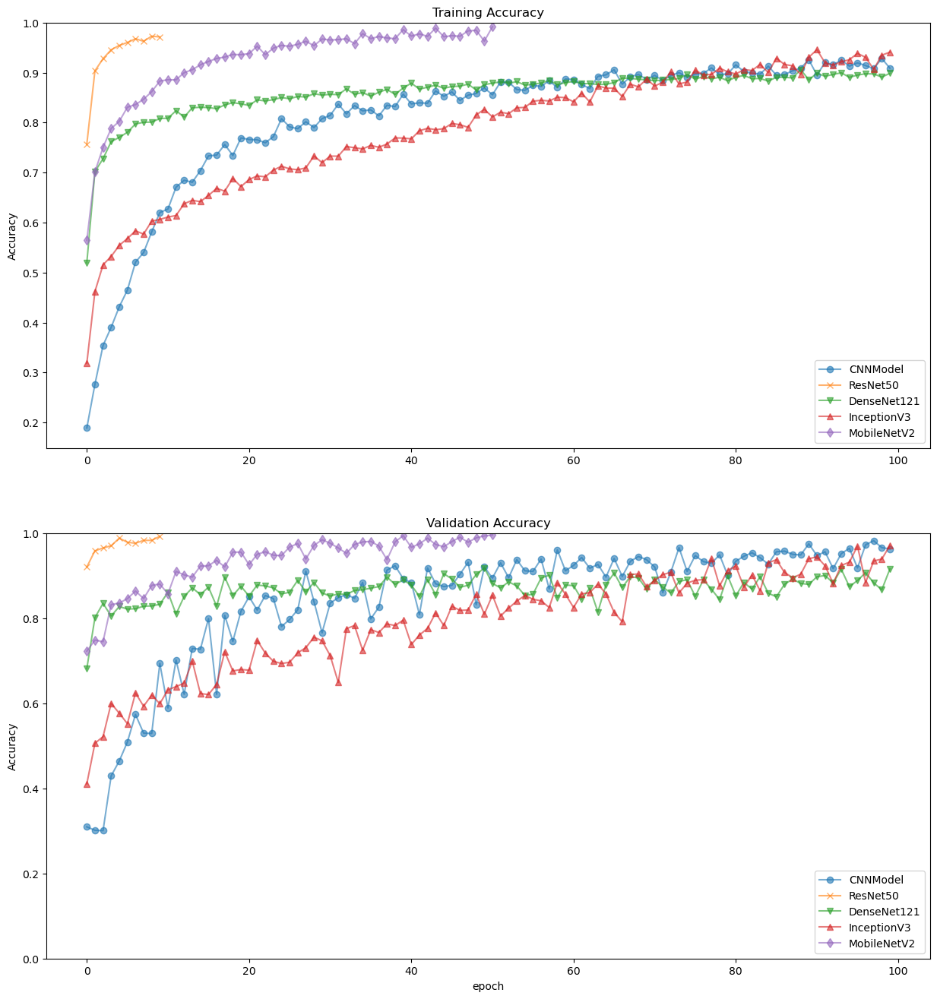

In [142]:
plt.figure(figsize=(15, 16))
plt.subplot(2, 1, 1)
for i in range(len(list_modelnames)):
  plt.plot(dict_acc[list_modelnames[i]], label=label_plot[i], marker=marker_plot[i], markersize=6, alpha=0.6)

plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training Accuracy')

plt.subplot(2, 1, 2)
for i in range(len(list_modelnames)):
  plt.plot(dict_val_acc[list_modelnames[i]], label=label_plot[i], marker=marker_plot[i], markersize=6, alpha=0.6)

plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([0,1.0])
plt.title('Validation Accuracy')
plt.xlabel('epoch')
plt.savefig('acc_all_model.png')

plt.show()

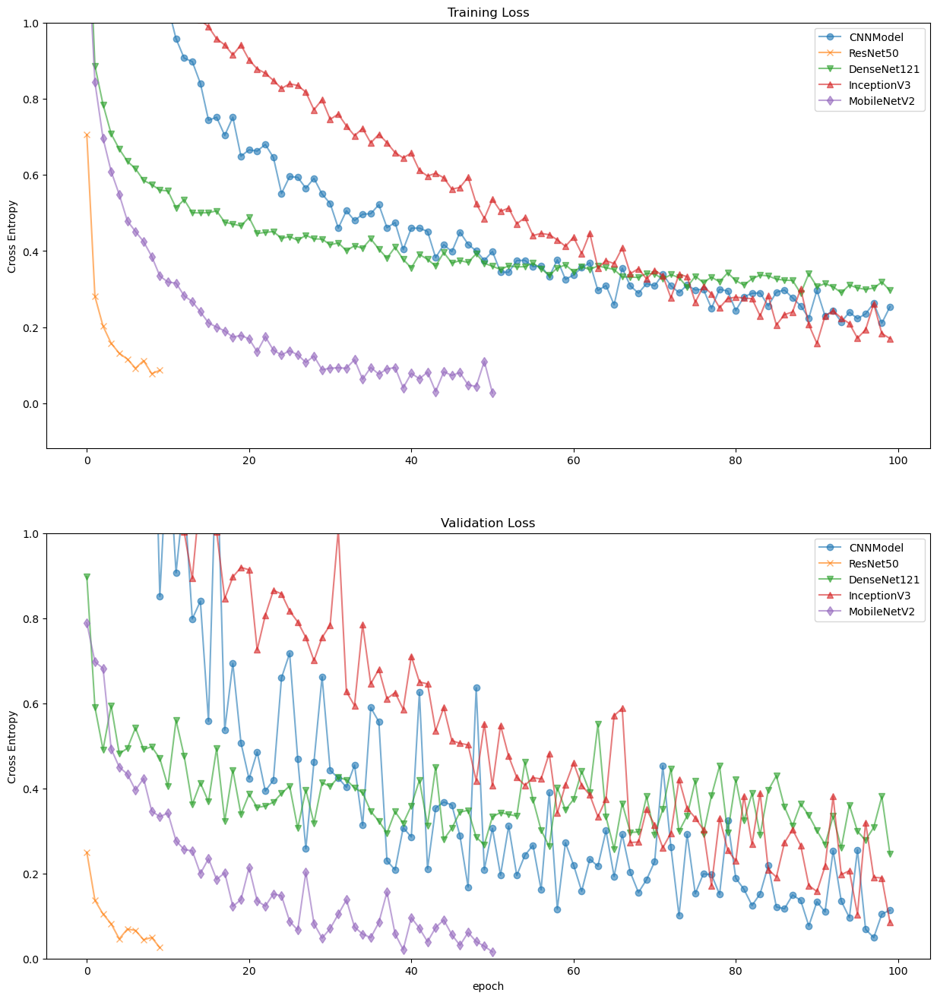

In [143]:
plt.figure(figsize=(15, 16))
plt.subplot(2, 1, 1)

for i in range(len(list_modelnames)):
  plt.plot(dict_loss[list_modelnames[i]], label=label_plot[i], marker=marker_plot[i], markersize=6, alpha=0.6)

plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training Loss')

plt.subplot(2, 1, 2)

for i in range(len(list_modelnames)):
  plt.plot(dict_val_loss[list_modelnames[i]], label=label_plot[i], marker=marker_plot[i], markersize=6, alpha=0.6)
  
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Validation Loss')
plt.xlabel('epoch')

plt.savefig('loss_all_model.png')

plt.show()

In [144]:
model_h5_names = ['CNNModel_Tomato_v1', 'MBNetv2Model_Tomato_v1', 
                  'Inceptionv3Model_Tomato_v1', 'DenseNet121Model_Tomato_v1', 'Resnet50Model_Tomato_v1']
dict_models = {}

for modelname in model_h5_names:
    dict_models[modelname] = tf.keras.models.load_model('{}.h5'.format(modelname))

In [151]:
dict_score_train = {}
dict_score_valid = {}
dict_score_test = {}

for modelname in model_h5_names:
  dict_score_train[modelname] = dict_models[modelname].evaluate(train_ds)
  dict_score_valid[modelname] = dict_models[modelname].evaluate(val_ds)
  dict_score_test[modelname] = dict_models[modelname].evaluate(test_ds)


15/15 [==============================] - 3s 67ms/step - loss: 0.0414 - accuracy: 0.9854


In [152]:
df1 = pd.DataFrame({
    'Model': list_modelnames,
    'Train': [eval[1] for eval in dict_score_train.values()],
    'Valid': [eval[1] for eval in dict_score_valid.values()],
    'Test': [eval[1] for eval in dict_score_test.values()],
})

df2 = pd.DataFrame({
    'Model': list_modelnames,
    'Train': [eval[0] for eval in dict_score_train.values()],
    'Valid': [eval[0] for eval in dict_score_valid.values()],
    'Test': [eval[0] for eval in dict_score_test.values()],
})

tidy1 = df1.melt(id_vars='Model').rename(columns=str.title)

tidy2 = df2.melt(id_vars='Model').rename(columns=str.title)

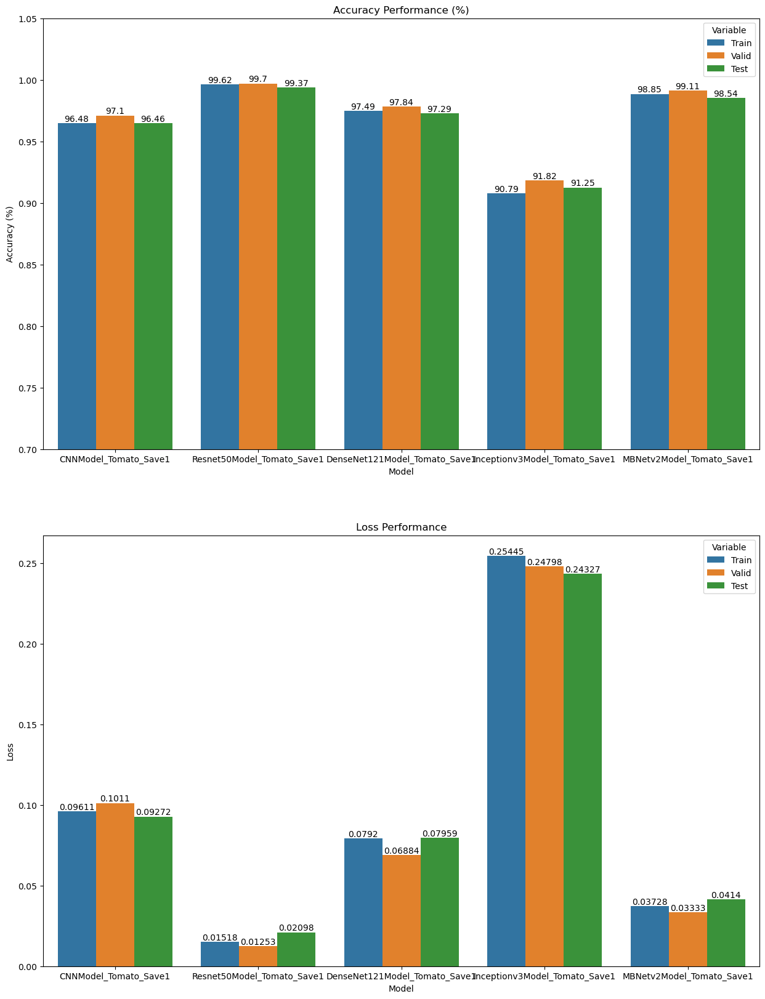

In [153]:

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 20))

sns.barplot(x='Model', y='Value', hue='Variable', data=tidy1, ax=ax1)
ax1.set_ylabel('Accuracy (%)')
ax1.set_ylim([0.7 ,1.05])
ax1.set_title('Accuracy Performance (%)')

for p, data in zip(ax1.patches, tidy1['Value']):
    ax1.annotate(round(data*100, 2), xy=(p.get_x()+p.get_width()/2, p.get_height()),
                ha='center', va='bottom')

sns.barplot(x='Model', y='Value', hue='Variable', data=tidy2, ax=ax2)
ax2.set_ylabel('Loss')
ax2.set_title('Loss Performance')

for p, data in zip(ax2.patches, tidy2['Value']):
    ax2.annotate(round(data, 5), xy=(p.get_x()+p.get_width()/2, p.get_height()),
                ha='center', va='bottom')

plt.savefig('tomato_all_model_comparisons.png')
plt.show()

## Best Model Conversion

In [154]:
tflite_converter = tf.lite.TFLiteConverter.from_keras_model(resnet_model)
tflite_model = tflite_converter.convert()
open("tf_lite_model_tomato.tflite", "wb").write(tflite_model)

INFO:tensorflow:Assets written to: C:\Users\marie\AppData\Local\Temp\tmp25lyvhxa\assets


c:\Users\marie\anaconda3\envs\tensorflow\lib\site-packages\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


98832740